In [ ]:
!pip install fiftyone
import fiftyone as fo
import fiftyone.zoo as foz
import tensorflow_datasets as tfds
import pandas as pd
import pickle
from google.colab import drive
import os
import json
from shutil import copyfile
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from shutil import copyfile
import numpy as np
from pathlib import Path
import torch
from PIL import Image, UnidentifiedImageError
import os
import platform
import sys
import subprocess
import torch
import torchvision
import subprocess
import tensorflow as tf
import torch
import yaml  # Make sure this import is present
import subprocess  # Make sure this import is present
import random

# Mount Google Drive
drive.mount('/content/drive')

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
INFO: pip is looking at multiple versions of motor to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.1/98.1 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.7/74.7 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 64.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.3/73.3 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 943.1/943.1 kB 55.6 MB/s eta 0:00:00
   ━━━━━━━━━━

In [ ]:
# Define the folder name
comparison_folder_name = "DataSetComparison"
comparison_folder_path = f'/content/drive/My Drive/{comparison_folder_name}'

# Create the directory if it doesn't exist
os.makedirs(comparison_folder_path, exist_ok=True)

# Define paths for saving
cache_folder_path = '/content/drive/MyDrive/DataSetComparison'
os.makedirs(cache_folder_path, exist_ok=True)
coco_stats_path = os.path.join(cache_folder_path, 'coco_stats.json')

# Load the entire MS COCO dataset using FiftyOne
coco_dataset = foz.load_zoo_dataset("coco-2017", splits=["train", "validation"],max_samples=500, dataset_name="coco-2017")

# EDA: Print sample attributes to inspect the COCO dataset
print("Sample attributes from COCO Dataset:")
coco_sample = coco_dataset.first()
print(coco_sample)

# Check and print the dataset size before filtering
print(f"COCO Dataset size before filtering: {len(coco_dataset)}")

# Confirm if 'ground_truth' field exists and inspect its structure
print("\nGround truth field structure:")
if hasattr(coco_sample, 'ground_truth'):
    print(coco_sample.ground_truth)

# Filter out samples without ground truth annotations
def filter_samples_with_ground_truth(dataset):
    filtered_samples = [sample for sample in dataset if sample.ground_truth and sample.ground_truth.detections]
    return filtered_samples

coco_filtered_samples = filter_samples_with_ground_truth(coco_dataset)

# Convert back to FiftyOne dataset
coco_dataset_filtered = fo.Dataset()
coco_dataset_filtered.add_samples(coco_filtered_samples)

# Check and print the dataset size after filtering
print(f"COCO Dataset size after filtering: {len(coco_dataset_filtered)}")

# Display a few sample images from the filtered COCO dataset
print("Displaying a few filtered sample images from the COCO dataset (with annotations):")
session = fo.launch_app(coco_dataset_filtered)
session.view = coco_dataset_filtered.limit(5)  # Display only 5 images

# If running in an environment where interaction is possible, uncomment this
# input("Press Enter to continue after reviewing the images...")

# Close the FiftyOne app session
session.close()

def get_coco_stats(dataset):
    stats = {}
    for sample in dataset:
        labels_seen = set()
        if hasattr(sample, 'ground_truth') and sample.ground_truth is not None and hasattr(sample.ground_truth, 'detections'):
            for detection in sample.ground_truth.detections:
                label = detection.label
                if label not in stats:
                    stats[label] = {"images": 0, "objects": 0}
                stats[label]["objects"] += 1
                labels_seen.add(label)
            for label in labels_seen:
                stats[label]["images"] += 1
    return stats


# Compute statistics for COCO
coco_stats = get_coco_stats(coco_dataset_filtered)

# Save statistics to JSON
with open(coco_stats_path, 'w') as f:
    json.dump(coco_stats, f)

# Debugging: print the computed stats
print("COCO Stats:", coco_stats)

# Create DataFrame for COCO
coco_df = pd.DataFrame(coco_stats).T
coco_df.columns = ["COCO Εικόνες", "COCO Αντικείμενα"]

# Display the DataFrame
print(coco_df)

print(f"COCO statistics saved to {coco_stats_path}")


INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/root/fiftyone/coco-2017/train' if necessary


INFO:fiftyone.utils.coco:Downloading annotations to '/root/fiftyone/coco-2017/tmp-download/annotations_trainval2017.zip'


   4% |------|   82.5Mb/1.9Gb [6.7s elapsed, 2.4m remaining, 22.1Mb/s]    


INFO:eta.core.utils:   4% |------|   82.5Mb/1.9Gb [6.7s elapsed, 2.4m remaining, 22.1Mb/s]    


KeyboardInterrupt: 

VOC stats


Sample attributes from PASCAL VOC Dataset:
{'image': array([[[101, 102,  32],
        [131, 132,  64],
        [106, 108,  43],
        ...,
        [ 58,  70,  22],
        [ 61,  73,  25],
        [ 61,  73,  27]],

       [[117, 120,  49],
        [124, 127,  58],
        [131, 133,  68],
        ...,
        [ 63,  72,  25],
        [ 67,  76,  29],
        [ 70,  79,  32]],

       [[135, 142,  72],
        [145, 152,  82],
        [137, 144,  76],
        ...,
        [ 76,  84,  35],
        [ 78,  86,  35],
        [ 78,  86,  35]],

       ...,

       [[129, 116, 126],
        [123, 111, 113],
        [109,  99,  87],
        ...,
        [ 19, 151, 130],
        [ 20, 149, 127],
        [ 20, 149, 129]],

       [[183, 167, 180],
        [120, 105, 110],
        [ 99,  86,  77],
        ...,
        [ 22, 151, 129],
        [ 22, 150, 127],
        [ 22, 149, 128]],

       [[196, 178, 192],
        [116,  99, 105],
        [ 90,  75,  68],
        ...,
        [ 23, 151, 1

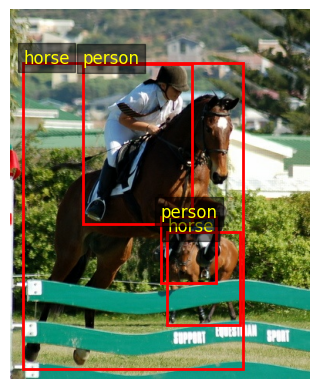

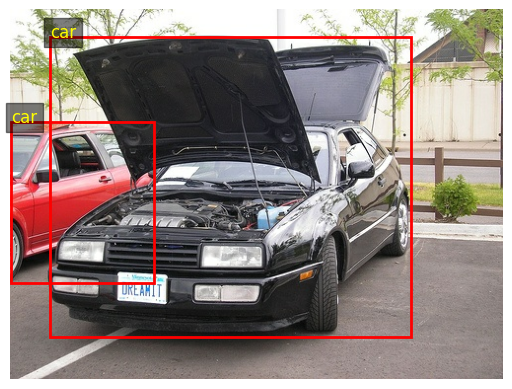

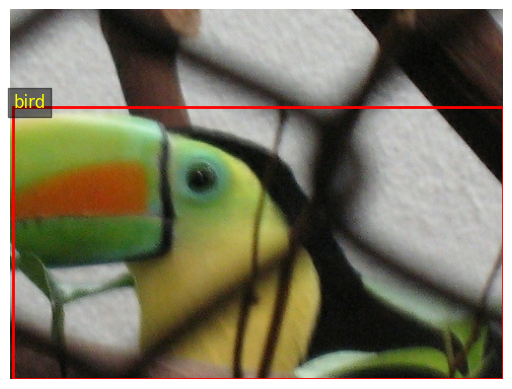

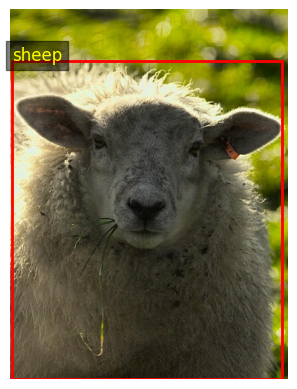

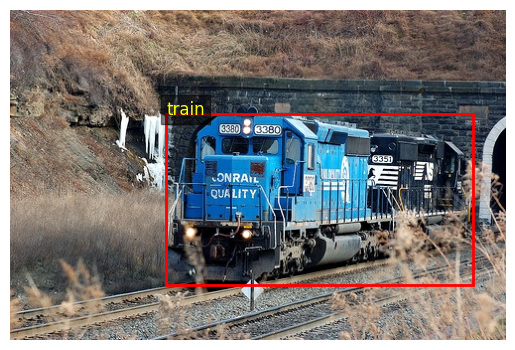

In [ ]:
import os
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import json

# Define paths for saving
save_folder_path = '/content/drive/MyDrive/DataSetComparison'
os.makedirs(save_folder_path, exist_ok=True)
pascal_stats_path = os.path.join(save_folder_path, 'pascal_stats.json')
pascal_df_path = os.path.join(save_folder_path, 'pascal_stats.csv')

# Load PASCAL VOC 2007 data using TensorFlow Datasets
pascal_dataset, pascal_info = tfds.load("voc/2007", with_info=True, split="train+validation")

# EDA: Print sample attributes to inspect the PASCAL VOC dataset
print("\nSample attributes from PASCAL VOC Dataset:")
for sample in tfds.as_numpy(pascal_dataset.take(1)):
    print(sample)

# Count the number of samples before filtering
num_total_samples = len(list(pascal_dataset))
print(f"Total number of PASCAL VOC samples before filtering: {num_total_samples}")

# Filter out samples without annotations in PASCAL VOC
def filter_pascal_samples(dataset):
    filtered_samples = []
    num_samples = 0
    for sample in tfds.as_numpy(dataset):
        num_samples += 1
        if sample["objects"]["label"].size > 0:
            filtered_samples.append(sample)
    return filtered_samples, num_samples

filtered_pascal_samples, pascal_num_samples = filter_pascal_samples(pascal_dataset)

# Count the number of samples after filtering
num_filtered_samples = len(filtered_pascal_samples)
print(f"Total number of PASCAL VOC samples after filtering: {num_filtered_samples}")

# Function to display images with annotations
def display_sample_with_annotations(sample, save_path=None):
    image = sample["image"]
    objects = sample["objects"]

    fig, ax = plt.subplots(1)
    ax.imshow(image)

    for bbox, label in zip(objects["bbox"], objects["label"]):
        # Convert bbox from relative to absolute coordinates
        ymin, xmin, ymax, xmax = bbox
        width = xmax - xmin
        height = ymax - ymin
        rect = patches.Rectangle(
            (xmin * image.shape[1], ymin * image.shape[0]),
            width * image.shape[1],
            height * image.shape[0],
            linewidth=2,
            edgecolor='r',
            facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(xmin * image.shape[1], ymin * image.shape[0],
                pascal_info.features["objects"]["label"].int2str(label),
                color='yellow', fontsize=12, bbox=dict(facecolor='black', alpha=0.5))

    plt.axis('off')

    if save_path:
        plt.savefig(save_path)
    else:
        plt.show()

# Display and save a few sample images with annotations
for i, sample in enumerate(filtered_pascal_samples[:5]):
    save_path = os.path.join(save_folder_path, f'pascal_sample_{i+1}.png')
    display_sample_with_annotations(sample, save_path=save_path)

# Compute statistics for PASCAL VOC
def get_pascal_stats(filtered_samples):
    stats = {}
    for sample in filtered_samples:
        labels_seen = set()
        for obj in sample["objects"]["label"]:
            label = pascal_info.features["objects"]["label"].int2str(obj)
            if label not in stats:
                stats[label] = {"images": 0, "objects": 0}
            stats[label]["objects"] += 1
            labels_seen.add(label)
        for label in labels_seen:
            stats[label]["images"] += 1
    return stats

pascal_stats = get_pascal_stats(filtered_pascal_samples)

# Save statistics to JSON
with open(pascal_stats_path, 'w') as f:
    json.dump(pascal_stats, f)

# Print the computed stats
print("PASCAL VOC Stats:", pascal_stats)

# Create DataFrame for PASCAL VOC
pascal_df = pd.DataFrame(pascal_stats).T
pascal_df.columns = ["PASCAL VOC Εικόνες", "PASCAL VOC Αντικείμενα"]

# Save DataFrame to CSV
pascal_df.to_csv(pascal_df_path, encoding='utf-8-sig')

# Display the DataFrame
print(pascal_df)
print(f"PASCAL VOC statistics saved to {pascal_stats_path}")


Comparison


In [ ]:
import os
import json
import pandas as pd

# Define paths for loading JSON stats
coco_stats_path = '/content/drive/MyDrive/DataSetComparison/coco_stats.json'
pascal_stats_path = '/content/drive/MyDrive/DataSetComparison/pascal_stats.json'

# Load the statistics from JSON files
with open(coco_stats_path, 'r') as f:
    coco_stats = json.load(f)

with open(pascal_stats_path, 'r') as f:
    pascal_stats = json.load(f)

# Create DataFrame for PASCAL VOC
pascal_df = pd.DataFrame(pascal_stats).T
pascal_df.columns = ["PASCAL VOC Εικόνες", "PASCAL VOC Αντικείμενα"]

# Combine category names from both datasets
coco_categories = set(coco_stats.keys())
pascal_categories = set(pascal_stats.keys())
all_categories = coco_categories.union(pascal_categories)

# Initialize combined statistics dictionary
combined_stats = {label: {
        "COCO Εικόνες": 0,
        "COCO Αντικείμενα": 0,
        "PASCAL VOC Εικόνες": 0,
        "PASCAL VOC Αντικείμενα": 0
    } for label in all_categories}

# Potential common categories with different names
potential_common_categories = {
    'aeroplane': 'airplane',
    'diningtable': 'dining table',
    'pottedplant': 'potted plant',
    'tvmonitor': 'tv',
    'sofa': 'couch',
    'motorbike': 'motorcycle'
}

# Populate COCO statistics
for label, stats in coco_stats.items():
    combined_stats[label]["COCO Εικόνες"] = stats["images"]
    combined_stats[label]["COCO Αντικείμενα"] = stats["objects"]

# Populate PASCAL VOC statistics
for label, stats in pascal_stats.items():
    if label in combined_stats:
        combined_stats[label]["PASCAL VOC Εικόνες"] = stats["images"]
        combined_stats[label]["PASCAL VOC Αντικείμενα"] = stats["objects"]
    elif label in potential_common_categories:
        mapped_label = potential_common_categories[label]
        combined_stats[mapped_label]["PASCAL VOC Εικόνες"] = stats["images"]
        combined_stats[mapped_label]["PASCAL VOC Αντικείμενα"] = stats["objects"]

# Check for common and unique categories
common_categories = coco_categories.intersection(pascal_categories)
unique_coco_categories = coco_categories - pascal_categories
unique_pascal_categories = pascal_categories - coco_categories

print("Common Categories:", common_categories)
print("Unique COCO Categories:", unique_coco_categories)
print("Unique PASCAL VOC Categories:", unique_pascal_categories)

# Create DataFrame for combined statistics
comparison_df = pd.DataFrame(combined_stats).T

# Fill missing values with zeros and convert to integers
comparison_df = comparison_df.fillna(0).astype(int)

# Print and save the comparison DataFrame
print(comparison_df)

# Save the DataFrame to Google Drive
csv_path = os.path.join('/content/drive/MyDrive/DataSetComparison', 'coco_pascal_comparison.csv')
comparison_df.to_csv(csv_path, encoding='utf-8-sig')

# Add the numbers to the DataFrame
no_annotations_df = pd.DataFrame({
    "Dataset": ["COCO", "PASCAL VOC"],
    "Images without annotations": [sum(coco_stats[label]['images'] for label in unique_coco_categories),
                                   sum(pascal_stats[label]['images'] for label in unique_pascal_categories)]
})

# Append this information to the CSV file
with open(csv_path, 'a') as f:
    no_annotations_df.to_csv(f, header=f.tell()==0, encoding='utf-8-sig', index=False)

print(no_annotations_df)


Common Categories: {'cat', 'bird', 'cow', 'chair', 'boat', 'sheep', 'dog', 'bus', 'bottle', 'horse', 'person', 'bicycle', 'car', 'train'}
Unique COCO Categories: {'scissors', 'sports ball', 'elephant', 'surfboard', 'bowl', 'spoon', 'laptop', 'broccoli', 'truck', 'fork', 'umbrella', 'toaster', 'vase', 'tennis racket', 'suitcase', 'refrigerator', 'apple', 'toothbrush', 'keyboard', 'bench', 'sandwich', 'snowboard', 'sink', 'book', 'couch', 'donut', 'skateboard', 'bear', 'orange', 'skis', 'handbag', 'pizza', 'tv', 'banana', 'fire hydrant', 'cell phone', 'remote', 'stop sign', 'bed', 'cup', 'hot dog', 'kite', 'potted plant', 'carrot', 'frisbee', 'traffic light', 'oven', 'hair drier', 'mouse', 'cake', 'teddy bear', 'baseball glove', 'backpack', 'motorcycle', 'zebra', 'clock', 'toilet', 'wine glass', 'baseball bat', 'microwave', 'giraffe', 'dining table', 'parking meter', 'tie', 'knife', 'airplane'}
Unique PASCAL VOC Categories: {'pottedplant', 'aeroplane', 'tvmonitor', 'sofa', 'motorbike', '

INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/root/fiftyone/coco-2017/train' if necessary


Found annotations at '/root/fiftyone/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/root/fiftyone/coco-2017/raw/instances_train2017.json'


Sufficient images already downloaded


INFO:fiftyone.utils.coco:Sufficient images already downloaded


Existing download of split 'train' is sufficient


INFO:fiftyone.zoo.datasets:Existing download of split 'train' is sufficient


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/coco-2017/validation' if necessary


Found annotations at '/root/fiftyone/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/root/fiftyone/coco-2017/raw/instances_val2017.json'


Sufficient images already downloaded


INFO:fiftyone.utils.coco:Sufficient images already downloaded


Existing download of split 'validation' is sufficient


INFO:fiftyone.zoo.datasets:Existing download of split 'validation' is sufficient


Loading existing dataset 'coco-2017'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use


INFO:fiftyone.zoo.datasets:Loading existing dataset 'coco-2017'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use


Initial COCO Dataset size: 10000
COCO Dataset size after filtering: 8070
Class counts before margin: {'cat': 406, 'person': 22285, 'car': 3824, 'chair': 3280, 'bottle': 2018, 'couch': 474, 'dog': 487, 'horse': 589, 'bicycle': 670, 'boat': 872, 'airplane': 369, 'bird': 864, 'bus': 551, 'dining table': 1316, 'sheep': 779, 'potted plant': 677, 'motorcycle': 750, 'train': 397, 'tv': 492, 'cow': 603}
Minimum class count: 369
Target instances per class: 553
Class: bicycle, Instance Count: 299
No reduction needed for bicycle, instances within target (299 <= 553)
Class: bird, Instance Count: 249
No reduction needed for bird, instances within target (249 <= 553)
Class: boat, Instance Count: 241
No reduction needed for boat, instances within target (241 <= 553)
Class: bottle, Instance Count: 740
Reduced bottle from 740 to 553 samples
Class: bus, Instance Count: 365
No reduction needed for bus, instances within target (365 <= 553)
Class: car, Instance Count: 1058
Reduced car from 1058 to 553 samp

INFO:fiftyone.zoo.datasets:Split 'validation' already downloaded


Loading existing dataset 'sampled_voc_subset'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use


INFO:fiftyone.zoo.datasets:Loading existing dataset 'sampled_voc_subset'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use


Loaded and saved 500 samples from VOC dataset as a new dataset.


<Figure size 1400x1000 with 0 Axes>

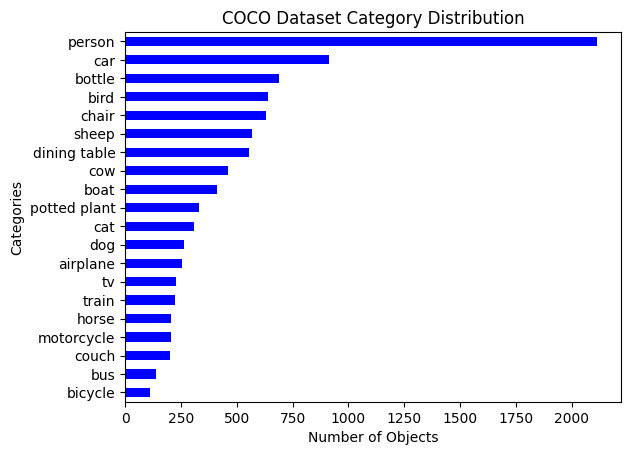

<Figure size 1400x1000 with 0 Axes>

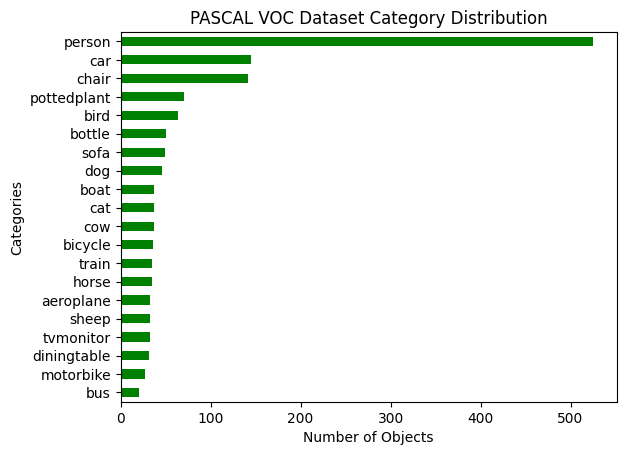

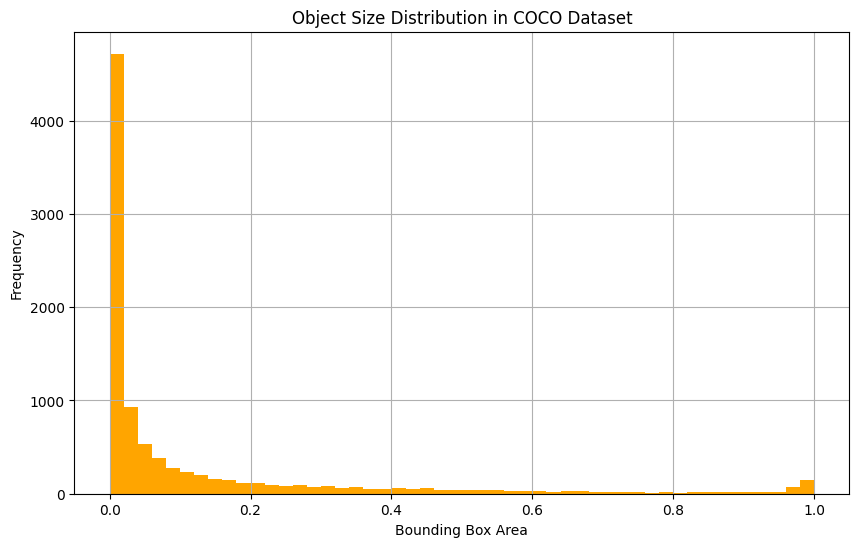

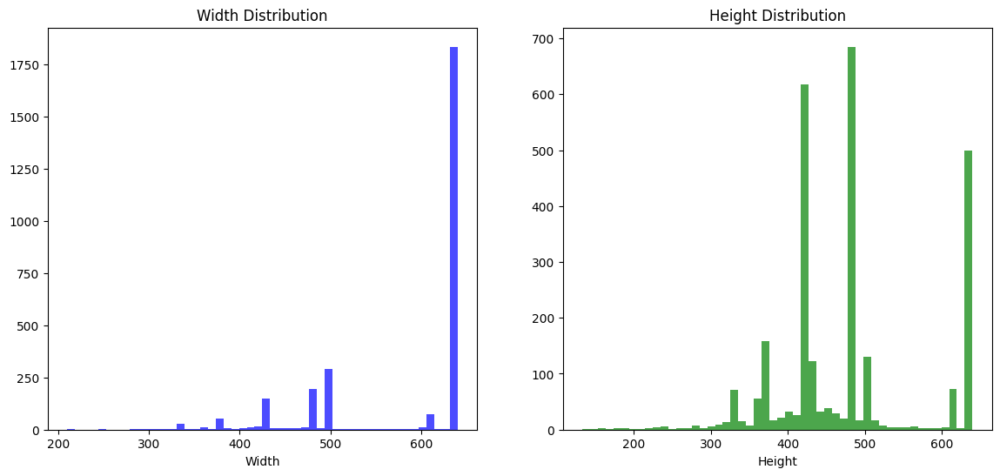

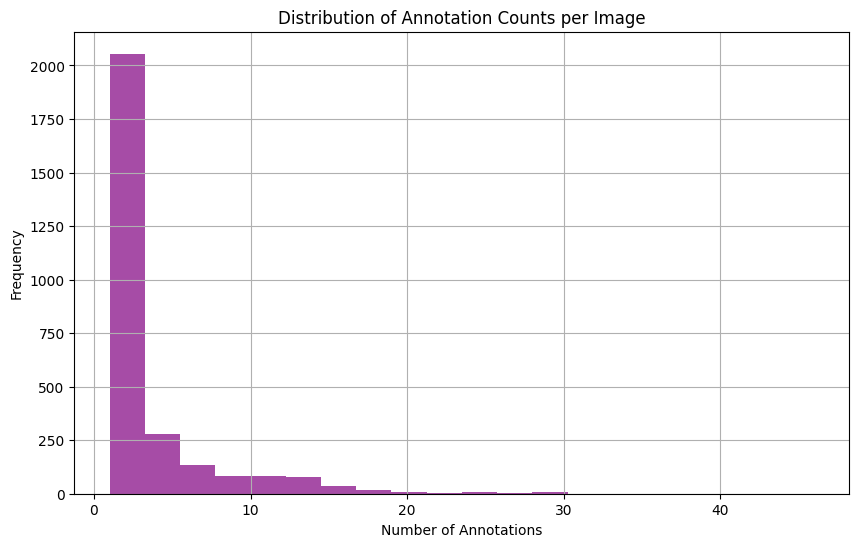

In [ ]:
import fiftyone.zoo as foz
import tensorflow_datasets as tfds
import yaml
from shutil import copyfile
import os
from PIL import Image, UnidentifiedImageError
from fiftyone import ViewField as F  # Correct import of ViewField

random.seed(42)
tf.random.set_seed(42)

# Define paths for YOLO-formatted datasets
yolo_coco_path = 'yolo_coco'
yolo_voc_path = 'yolo_voc'

# Create directories for train, validation, and test labels
os.makedirs(os.path.join(yolo_coco_path, 'images', 'train'), exist_ok=True)
os.makedirs(os.path.join(yolo_coco_path, 'labels', 'train'), exist_ok=True)
os.makedirs(os.path.join(yolo_coco_path, 'images', 'val'), exist_ok=True)
os.makedirs(os.path.join(yolo_coco_path, 'labels', 'val'), exist_ok=True)
os.makedirs(os.path.join(yolo_voc_path, 'images', 'test'), exist_ok=True)
os.makedirs(os.path.join(yolo_voc_path, 'labels', 'test'), exist_ok=True)

# Function to check if an image is valid
def is_valid_image(file_path):
    try:
        img = Image.open(file_path)
        img.verify()  # Verify that it is, in fact, an image
        return True
    except (IOError, SyntaxError, UnidentifiedImageError):
        return False


# Full list of VOC class names (in correct order according to VOC dataset)
voc_class_names = [
    'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
    'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
    'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'
]

# Define the mapping between VOC and COCO categories that need renaming
voc_to_coco_class_mapping = {
    'aeroplane': 'airplane',
    'motorbike': 'motorcycle',
    'sofa': 'couch',
    'diningtable': 'dining table',
    'pottedplant': 'potted plant',
    'tvmonitor': 'tv'
}

# Revised Mapping: This should map COCO labels to their VOC equivalents
coco_to_voc_class_mapping = {
    'airplane': 'aeroplane',
    'motorcycle': 'motorbike',
    'couch': 'sofa',
    'dining table': 'diningtable',
    'potted plant': 'pottedplant',
    'tv': 'tvmonitor'
}

# COCO class names
coco_class_names = [
    'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat',
    'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat',
    'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack',
    'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
    'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop',
    'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink',
    'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# Combine directly common categories and mapped categories
directly_common_categories = [name for name in voc_class_names if name in coco_class_names]
mapped_categories = list(voc_to_coco_class_mapping.values())
common_categories = directly_common_categories + mapped_categories

# Load the COCO dataset using FiftyOne
coco_dataset = foz.load_zoo_dataset("coco-2017", splits=["train", "validation"], max_samples=5000, dataset_name="coco-2017")
# Print the initial length of the COCO dataset
print(f"Initial COCO Dataset size: {len(coco_dataset)}")
# Define a ViewField to filter labels based on common categories
label_field = F("label")
# Filter out samples that do not have any detections in common categories
coco_dataset = coco_dataset.filter_labels("ground_truth", label_field.is_in(common_categories))
# Print the length of the COCO dataset after filtering
print(f"COCO Dataset size after filtering: {len(coco_dataset)}")


# Count the number of samples per class
class_counts = coco_dataset.count_values("ground_truth.detections.label")
print(f"Class counts before margin: {class_counts}")
# Calculate the minimum class count in the dataset
min_class_count = min(class_counts.values())

# Define a margin (e.g., 50% above the minimum)
margin = 0.5
target_instances = int(min_class_count * (1 + margin))

print(f"Minimum class count: {min_class_count}")
print(f"Target instances per class: {target_instances}")

# Adjust the class distribution in the COCO dataset
for cls in common_categories:
    # Filter the dataset for samples that contain the specific class (label)
    class_view = coco_dataset.filter_labels("ground_truth", F("label") == cls)

    # Debug: Print the number of instances before filtering
    print(f"Class: {cls}, Instance Count: {len(class_view)}")

    # Check if the class has more instances than the target number
    if len(class_view) > target_instances:
        # Select a random subset of the class to keep
        to_keep = class_view.take(target_instances, seed=42)

        # Collect the IDs of the samples to keep
        to_keep_ids = [sample.id for sample in to_keep]

        # Exclude the samples not in to_keep from the coco_dataset
        coco_dataset = coco_dataset.exclude([sample.id for sample in class_view if sample.id not in to_keep_ids])

        # Debug: Print the reduction details
        print(f"Reduced {cls} from {len(class_view)} to {len(to_keep)} samples")
    else:
        # Debug: Print when no reduction is applied
        print(f"No reduction needed for {cls}, instances within target ({len(class_view)} <= {target_instances})")

# After adjustment, re-check the class counts
new_class_counts = coco_dataset.count_values("ground_truth.detections.label")
print(f"New class counts after adjustment: {new_class_counts}")


# # Load a random subset of the COCO dataset directly
# num_samples_coco = 500  # Set to the desired number of samples
# coco_dataset = foz.load_zoo_dataset(
#     "coco-2017",
#     splits=["train", "validation"],
#     max_samples=num_samples_coco,
#     shuffle=True,  # Ensure randomness in the samples selected
#     seed=42,       # Set seed for reproducibility
#     dataset_name="sampled_coco_subset"
# )


# Load a random subset of the VOC dataset directly with error handling
try:
    num_samples_voc = 500  # Set to the desired number of samples
    voc_dataset = foz.load_zoo_dataset(
        "voc-2007",
        splits=["validation"],
        max_samples=num_samples_voc,
        shuffle=True,  # Ensure randomness in the samples selected
        seed=42,       # Set seed for reproducibility
        dataset_name="sampled_voc_subset"
    )
    # Make the new dataset persistent
    voc_dataset.persistent = True

    print(f"Loaded and saved {num_samples_voc} samples from VOC dataset as a new dataset.")

except UnidentifiedImageError as e:
    print(f"Error loading VOC dataset: {e}")

# EDA (Exploratory Data Analysis)

# Assume we have DataFrames created from the datasets
coco_categories = [det.label for sample in coco_dataset for det in sample.ground_truth.detections]
coco_df = pd.DataFrame(coco_categories, columns=["COCO Αντικείμενα"]).value_counts().reset_index(name='counts')

voc_categories = [det.label for sample in voc_dataset for det in sample.ground_truth.detections]
pascal_df = pd.DataFrame(voc_categories, columns=["PASCAL VOC Αντικείμενα"]).value_counts().reset_index(name='counts')

# Bar chart for category distributions in COCO dataset
plt.figure(figsize=(14, 10))
coco_df.sort_values(by='counts').plot(kind='barh', x='COCO Αντικείμενα', y='counts', color='blue', legend=False)
plt.xlabel('Number of Objects')
plt.ylabel('Categories')
plt.title('COCO Dataset Category Distribution')
plt.show()

# Bar chart for category distributions in PASCAL VOC dataset
plt.figure(figsize=(14, 10))
pascal_df.sort_values(by='counts').plot(kind='barh', x='PASCAL VOC Αντικείμενα', y='counts', color='green', legend=False)
plt.xlabel('Number of Objects')
plt.ylabel('Categories')
plt.title('PASCAL VOC Dataset Category Distribution')
plt.show()

# Object Size Distribution in COCO Dataset
plt.figure(figsize=(10, 6))
object_sizes = [det.bounding_box[2] * det.bounding_box[3] for sample in coco_dataset for det in sample.ground_truth.detections]
pd.Series(object_sizes).hist(bins=50, color='orange')
plt.title('Object Size Distribution in COCO Dataset')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.show()

# Image Dimensions Distribution in COCO Dataset
widths = [sample.metadata.width for sample in coco_dataset]
heights = [sample.metadata.height for sample in coco_dataset]

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.hist(widths, bins=50, color='blue', alpha=0.7)
plt.title('Width Distribution')
plt.xlabel('Width')

plt.subplot(1, 2, 2)
plt.hist(heights, bins=50, color='green', alpha=0.7)
plt.title('Height Distribution')
plt.xlabel('Height')

plt.show()

# Distribution of Annotation Counts per Image
annotation_counts = [len(sample.ground_truth.detections) for sample in coco_dataset]

plt.figure(figsize=(10, 6))
pd.Series(annotation_counts).hist(bins=20, color='purple', alpha=0.7)
plt.title('Distribution of Annotation Counts per Image')
plt.xlabel('Number of Annotations')
plt.ylabel('Frequency')
plt.show()





Large COCO, and VOC test

<Figure size 1400x1000 with 0 Axes>

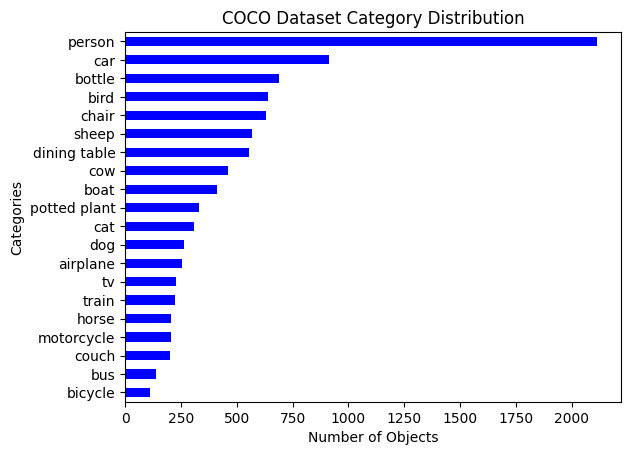

<Figure size 1400x1000 with 0 Axes>

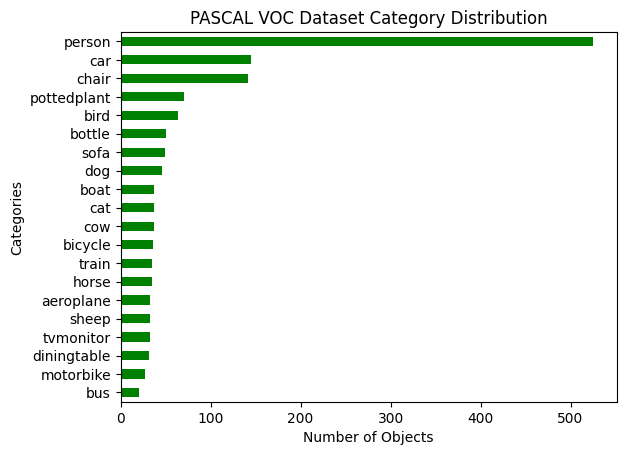

<Figure size 1400x1000 with 0 Axes>

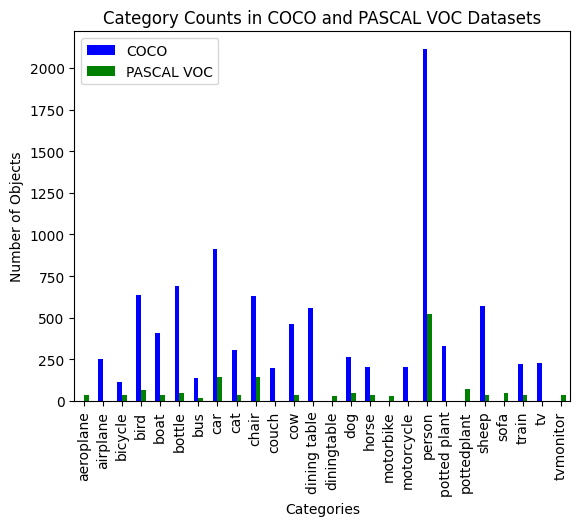

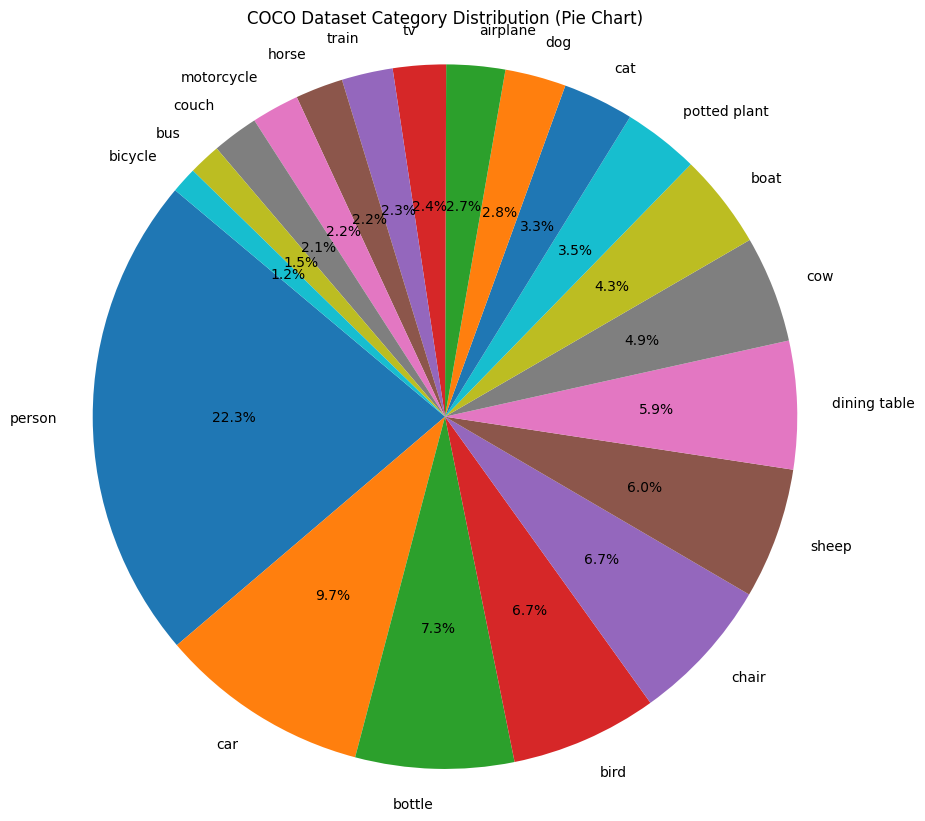

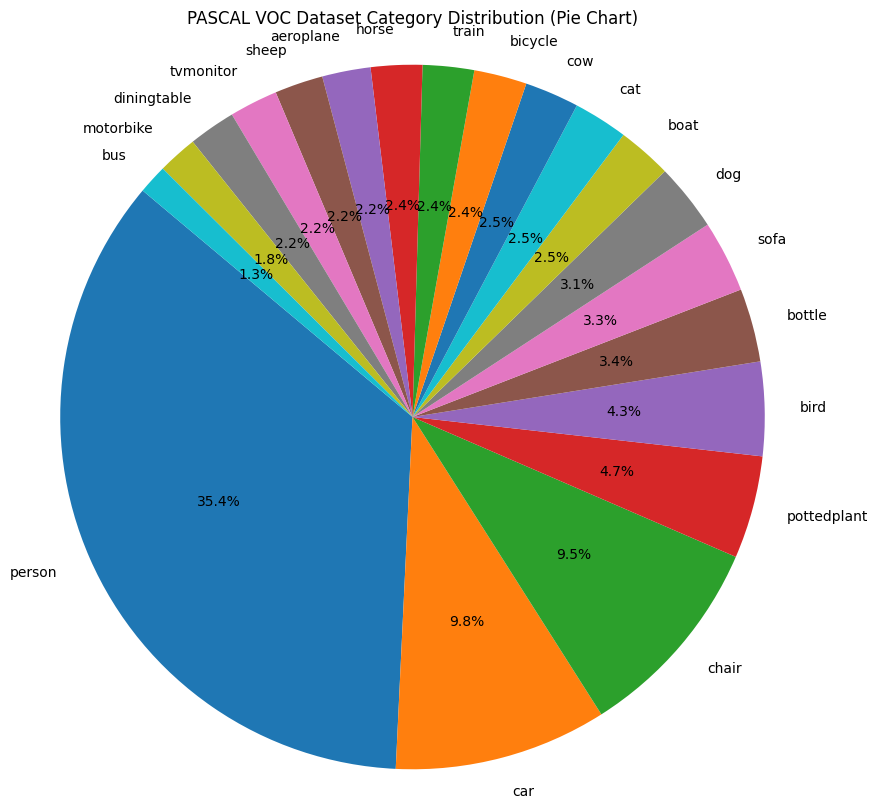

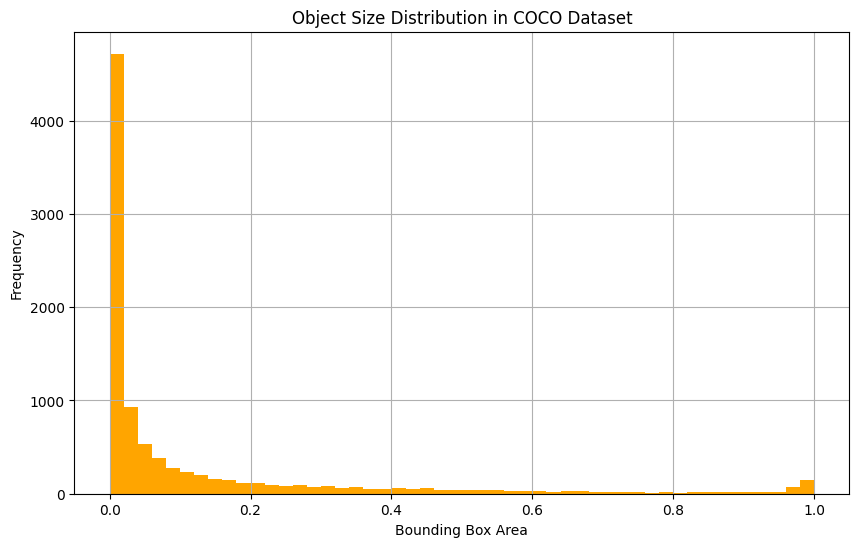

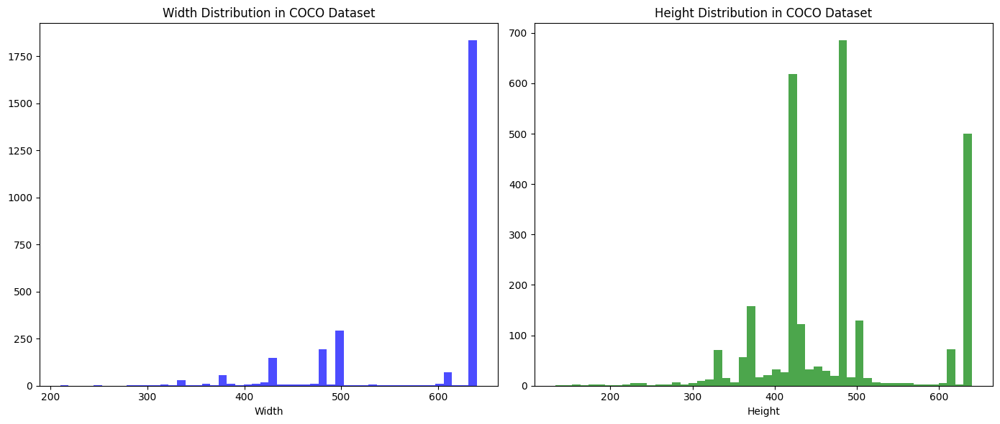

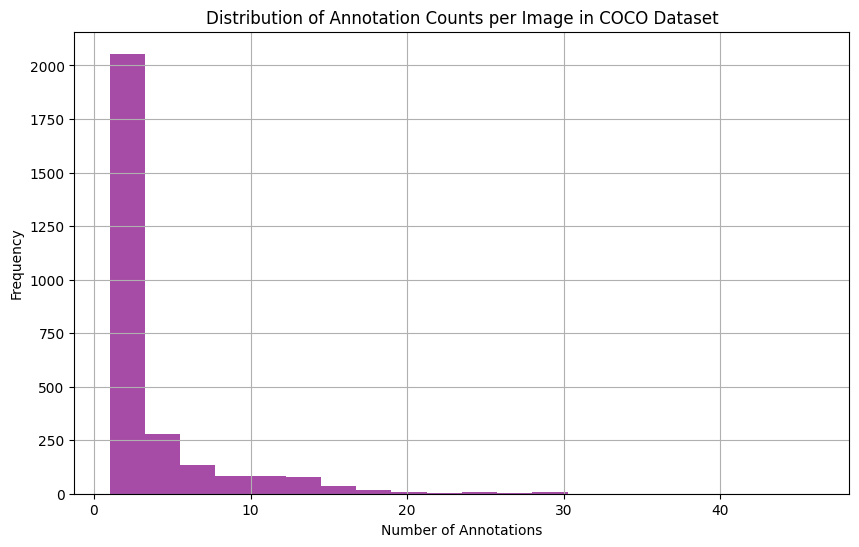

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Bar chart for category distributions in COCO dataset
plt.figure(figsize=(14, 10))
coco_df.sort_values(by='counts').plot(kind='barh', x='COCO Αντικείμενα', y='counts', color='blue', legend=False)
plt.xlabel('Number of Objects')
plt.ylabel('Categories')
plt.title('COCO Dataset Category Distribution')
plt.show()

# Bar chart for category distributions in PASCAL VOC dataset
plt.figure(figsize=(14, 10))
pascal_df.sort_values(by='counts').plot(kind='barh', x='PASCAL VOC Αντικείμενα', y='counts', color='green', legend=False)
plt.xlabel('Number of Objects')
plt.ylabel('Categories')
plt.title('PASCAL VOC Dataset Category Distribution')
plt.show()

# Combined Bar chart for category distributions in both datasets
combined_counts = pd.DataFrame({
    'COCO': coco_df.set_index('COCO Αντικείμενα')['counts'],
    'PASCAL VOC': pascal_df.set_index('PASCAL VOC Αντικείμενα')['counts']
}).fillna(0)  # Filling NaNs for categories not present in both datasets

plt.figure(figsize=(14, 10))
combined_counts.plot(kind='bar', stacked=False, color=['blue', 'green'])
plt.title('Category Counts in COCO and PASCAL VOC Datasets')
plt.xlabel('Categories')
plt.ylabel('Number of Objects')
plt.legend(["COCO", "PASCAL VOC"])
plt.show()

# Pie chart for category distribution in COCO Dataset
plt.figure(figsize=(10, 10))
plt.pie(coco_df['counts'], labels=coco_df['COCO Αντικείμενα'], autopct='%1.1f%%', startangle=140)
plt.title('COCO Dataset Category Distribution (Pie Chart)')
plt.axis('equal')
plt.show()

# Pie chart for category distribution in PASCAL VOC Dataset
plt.figure(figsize=(10, 10))
plt.pie(pascal_df['counts'], labels=pascal_df['PASCAL VOC Αντικείμενα'], autopct='%1.1f%%', startangle=140)
plt.title('PASCAL VOC Dataset Category Distribution (Pie Chart)')
plt.axis('equal')
plt.show()

# Object Size Distribution in COCO Dataset
plt.figure(figsize=(10, 6))
object_sizes = [det.bounding_box[2] * det.bounding_box[3] for sample in coco_dataset for det in sample.ground_truth.detections]
pd.Series(object_sizes).hist(bins=50, color='orange')
plt.title('Object Size Distribution in COCO Dataset')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.show()

# Image Dimensions Distribution in COCO Dataset
widths = [sample.metadata.width for sample in coco_dataset]
heights = [sample.metadata.height for sample in coco_dataset]

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.hist(widths, bins=50, color='blue', alpha=0.7)
plt.title('Width Distribution in COCO Dataset')
plt.xlabel('Width')

plt.subplot(1, 2, 2)
plt.hist(heights, bins=50, color='green', alpha=0.7)
plt.title('Height Distribution in COCO Dataset')
plt.xlabel('Height')

plt.tight_layout()
plt.show()

# Distribution of Annotation Counts per Image in COCO Dataset
annotation_counts = [len(sample.ground_truth.detections) for sample in coco_dataset]

plt.figure(figsize=(10, 6))
pd.Series(annotation_counts).hist(bins=20, color='purple', alpha=0.7)
plt.title('Distribution of Annotation Counts per Image in COCO Dataset')
plt.xlabel('Number of Annotations')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Navigate to the correct base directory
os.chdir('/content')

# Verify the current working directory
print("Current working directory:", os.getcwd())
# Clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
# Install requirements
!pip install -r requirements.txt

Current working directory: /content
Cloning into 'yolov5'...
remote: Enumerating objects: 16965, done.
remote: Counting objects: 100% (160/160), done.
remote: Compressing objects: 100% (111/111), done.
remote: Total 16965 (delta 82), reused 100 (delta 49), pack-reused 16805 (from 1)
Receiving objects: 100% (16965/16965), 15.71 MiB | 29.63 MiB/s, done.
Resolving deltas: 100% (11615/11615), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 874.8/874.8 kB 24.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.9 MB/s eta 0:00:00


In [ ]:
import fiftyone.zoo as foz
import tensorflow_datasets as tfds
import yaml
from shutil import copyfile
import os
from PIL import Image, UnidentifiedImageError
from fiftyone import ViewField as F  # Correct import of ViewField

random.seed(42)
tf.random.set_seed(42)

# Define paths for YOLO-formatted datasets
yolo_coco_path = 'yolo_coco'
yolo_voc_path = 'yolo_voc'

# Create directories for train, validation, and test labels
os.makedirs(os.path.join(yolo_coco_path, 'images', 'train'), exist_ok=True)
os.makedirs(os.path.join(yolo_coco_path, 'labels', 'train'), exist_ok=True)
os.makedirs(os.path.join(yolo_coco_path, 'images', 'val'), exist_ok=True)
os.makedirs(os.path.join(yolo_coco_path, 'labels', 'val'), exist_ok=True)
os.makedirs(os.path.join(yolo_voc_path, 'images', 'test'), exist_ok=True)
os.makedirs(os.path.join(yolo_voc_path, 'labels', 'test'), exist_ok=True)

# Function to check if an image is valid
def is_valid_image(file_path):
    try:
        img = Image.open(file_path)
        img.verify()  # Verify that it is, in fact, an image
        return True
    except (IOError, SyntaxError, UnidentifiedImageError):
        return False


# Full list of VOC class names (in correct order according to VOC dataset)
voc_class_names = [
    'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
    'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
    'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'
]

# Define the mapping between VOC and COCO categories that need renaming
voc_to_coco_class_mapping = {
    'aeroplane': 'airplane',
    'motorbike': 'motorcycle',
    'sofa': 'couch',
    'diningtable': 'dining table',
    'pottedplant': 'potted plant',
    'tvmonitor': 'tv'
}

# Revised Mapping: This should map COCO labels to their VOC equivalents
coco_to_voc_class_mapping = {
    'airplane': 'aeroplane',
    'motorcycle': 'motorbike',
    'couch': 'sofa',
    'dining table': 'diningtable',
    'potted plant': 'pottedplant',
    'tv': 'tvmonitor'
}

# COCO class names
coco_class_names = [
    'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat',
    'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat',
    'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack',
    'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
    'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop',
    'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink',
    'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# Combine directly common categories and mapped categories
directly_common_categories = [name for name in voc_class_names if name in coco_class_names]
mapped_categories = list(voc_to_coco_class_mapping.values())
common_categories = directly_common_categories + mapped_categories

# Load the COCO dataset using FiftyOne
coco_dataset = foz.load_zoo_dataset("coco-2017", splits=["train", "validation"], max_samples=5000, dataset_name="coco-2017")
# Print the initial length of the COCO dataset
print(f"Initial COCO Dataset size: {len(coco_dataset)}")
# Define a ViewField to filter labels based on common categories
label_field = F("label")
# Filter out samples that do not have any detections in common categories
coco_dataset = coco_dataset.filter_labels("ground_truth", label_field.is_in(common_categories))
# Print the length of the COCO dataset after filtering
print(f"COCO Dataset size after filtering: {len(coco_dataset)}")


# Count the number of samples per class
class_counts = coco_dataset.count_values("ground_truth.detections.label")
print(f"Class counts before margin: {class_counts}")
# Calculate the minimum class count in the dataset
min_class_count = min(class_counts.values())

# Define a margin (e.g., 50% above the minimum)
margin = 0.5
target_instances = int(min_class_count * (1 + margin))

print(f"Minimum class count: {min_class_count}")
print(f"Target instances per class: {target_instances}")

# Adjust the class distribution in the COCO dataset
for cls in common_categories:
    # Filter the dataset for samples that contain the specific class (label)
    class_view = coco_dataset.filter_labels("ground_truth", F("label") == cls)

    # Debug: Print the number of instances before filtering
    print(f"Class: {cls}, Instance Count: {len(class_view)}")

    # Check if the class has more instances than the target number
    if len(class_view) > target_instances:
        # Select a random subset of the class to keep
        to_keep = class_view.take(target_instances, seed=42)

        # Collect the IDs of the samples to keep
        to_keep_ids = [sample.id for sample in to_keep]

        # Exclude the samples not in to_keep from the coco_dataset
        coco_dataset = coco_dataset.exclude([sample.id for sample in class_view if sample.id not in to_keep_ids])

        # Debug: Print the reduction details
        print(f"Reduced {cls} from {len(class_view)} to {len(to_keep)} samples")
    else:
        # Debug: Print when no reduction is applied
        print(f"No reduction needed for {cls}, instances within target ({len(class_view)} <= {target_instances})")

# After adjustment, re-check the class counts
new_class_counts = coco_dataset.count_values("ground_truth.detections.label")
print(f"New class counts after adjustment: {new_class_counts}")



# Define the validation split ratio
validation_ratio = 0.2  # 20% for validation

# Calculate the number of samples for training and validation
total_samples = len(coco_dataset)
num_val_samples = int(total_samples * validation_ratio)
num_train_samples = total_samples - num_val_samples

# Split the dataset into training and validation sets
coco_train = coco_dataset[:num_train_samples]
coco_val = coco_dataset[num_train_samples:]

# Print the length of the COCO train and validation datasets
print(f"COCO Training set size: {len(coco_train)}")
print(f"COCO Validation set size: {len(coco_val)}")

# Load the PASCAL VOC dataset
pascal_dataset, pascal_info = tfds.load("voc/2007", with_info=True, split="train+validation")

# Print the length of the VOC dataset
print(f"PASCAL VOC Dataset size: {len(list(pascal_dataset))}")

# Filter VOC dataset to only keep common categories
def filter_voc_samples(samples):
    filtered_samples = []
    for sample in samples:
        keep_sample = False
        for label_id in sample['objects']['label']:
            voc_label = voc_class_names[label_id]
            if voc_label in voc_to_coco_class_mapping or voc_label in directly_common_categories:
                keep_sample = True
                break
        if keep_sample:
            filtered_samples.append(sample)
    return filtered_samples

filtered_voc_samples = filter_voc_samples(pascal_dataset)
num_samples_to_select = 500  # For example, select 500 samples

# Randomly sample from the dataset
random.seed(42)  # Set a seed for reproducibility
selected_voc_samples = random.sample(filtered_voc_samples, num_samples_to_select)


# Print the length of the VOC dataset after filtering
print(f"PASCAL VOC Dataset size after filtering: {len(filtered_voc_samples)}")

def convert_and_update_coco_to_yolo(samples, split='train'):
    updated_samples = []
    for sample in samples:
        img_filename = os.path.basename(sample.filepath)
        yolo_img_path = os.path.join(yolo_coco_path, 'images', split, img_filename)
        copyfile(sample.filepath, yolo_img_path)

        label_filename = img_filename.replace('.jpg', '.txt')
        label_file_path = os.path.join(yolo_coco_path, 'labels', split, label_filename)

        if sample.ground_truth and sample.ground_truth.detections:
            new_detections = []
            with open(label_file_path, 'w') as f:
                for detection in sample.ground_truth.detections:
                    label = detection.label

                    if label in coco_to_voc_class_mapping:
                        voc_label = coco_to_voc_class_mapping[label]  # Convert COCO label to VOC label
                        class_id = voc_class_names.index(voc_label)
                    elif label in directly_common_categories:
                        class_id = voc_class_names.index(label)
                    else:
                        print(f"Warning: Found a label not in common categories: {label}, skipping detection.")
                        continue  # Skip detections that do not map to VOC

                    # Update the detection with the new class_id
                    detection.label = class_id
                    new_detections.append(detection)

                    # Write the YOLO formatted label
                    bbox = detection.bounding_box
                    x_center = bbox[0] + bbox[2] / 2
                    y_center = bbox[1] + bbox[3] / 2
                    width = bbox[2]
                    height = bbox[3]
                    f.write(f"{class_id} {x_center} {y_center} {width} {height}\n")

                    # Debug output
                    #print(f"Written label: {class_id}, bbox: {x_center}, {y_center}, {width}, {height}")

            # Update the sample's detections with the new ones
            sample.ground_truth.detections = new_detections
            updated_samples.append(sample)
        else:
            print(f"No detections found for image {img_filename}. Skipping...")

    return updated_samples


# Convert COCO dataset to YOLO format
coco_train= convert_and_update_coco_to_yolo(coco_train, split='train')
coco_val= convert_and_update_coco_to_yolo(coco_val, split='val')



def convert_voc_to_yolo(samples):
    for sample in samples:
        img_filename = None  # Initialize img_filename to avoid UnboundLocalError
        try:
            # Convert TensorFlow string tensor to Python string
            img_filename = sample['image/filename'].numpy().decode('utf-8')
            img_path = os.path.join(yolo_voc_path, 'images', 'test', img_filename)
            Image.fromarray(sample['image'].numpy()).save(img_path)

            label_filename = img_filename.replace('.jpg', '.txt')
            with open(os.path.join(yolo_voc_path, 'labels', 'test', label_filename), 'w') as f:
                for i, bbox in enumerate(sample['objects']['bbox']):
                    label_id = sample['objects']['label'][i]
                    if label_id < len(voc_class_names):
                        voc_label = voc_class_names[label_id]  # Get the VOC label
                        # Check if the VOC label needs to be renamed to a COCO label
                        coco_label = voc_to_coco_class_mapping.get(voc_label, voc_label)
                        class_id = coco_class_names.index(coco_label)  # Find the corresponding COCO class ID

                        x_min, y_min, x_max, y_max = bbox
                        x_center = (x_min + x_max) / 2
                        y_center = (y_min + y_max) / 2
                        width = x_max - x_min
                        height = y_max - y_min
                        f.write(f"{class_id} {x_center} {y_center} {width} {height}\n")
                    else:
                        print(f"Label ID {label_id} out of bounds for VOC class names. Skipping detection.")
        except Exception as e:
            print(f"Error processing {img_filename}: {e}")

# Convert VOC dataset to YOLO format for testing
convert_voc_to_yolo(pascal_dataset)

# Write the data configuration files for training and validation (COCO)
with open("coco.yaml", "w") as f:
    f.write(f"train: {yolo_coco_path}/images/train\n")
    f.write(f"val: {yolo_coco_path}/images/val\n")
    f.write(f"nc: {len(common_categories)}\n")  # Use the number of common categories
    f.write("names: [")
    f.write(", ".join([f"'{name}'" for name in common_categories]))
    f.write("]\n")

# Write the data configuration file for testing (VOC)
with open("voc.yaml", "w") as f:
    f.write(f"train: {yolo_coco_path}/images/train\n")
    f.write(f"val: {yolo_coco_path}/images/val\n")

    f.write(f"test: {yolo_voc_path}/images/test\n")
    f.write(f"nc: {len(common_categories)}\n")  # Ensure VOC also reflects the common categories
    f.write("names: [")
    f.write(", ".join([f"'{name}'" for name in common_categories]))
    f.write("]\n")


# Function to validate dataset
def validate_dataset(dataset_yaml):
    with open(dataset_yaml, 'r') as file:
        data = yaml.safe_load(file)

    train_images_path = data.get('train', '')
    val_images_path = data.get('val', '')
    test_images_path = data.get('test', '')

    invalid_count = 0
    max_invalids = 10
    invalids_logged = []

    # Validate training images
    if train_images_path:
        train_images = [os.path.join(train_images_path, f) for f in os.listdir(train_images_path) if f.endswith(('jpg', 'jpeg', 'png'))]
        for img_path in train_images:
            if not is_valid_image(img_path):
                invalid_count += 1
                if invalid_count <= max_invalids:
                    invalids_logged.append(f"Invalid image found and skipped: {img_path}")
                if invalid_count == max_invalids:
                    invalids_logged.append("Too many invalid images, stopping further logging.")
                    break  # Stop after reaching the invalid limit

    # Validate validation images
    if val_images_path:
        val_images = [os.path.join(val_images_path, f) for f in os.listdir(val_images_path) if f.endswith(('jpg', 'jpeg', 'png'))]
        for img_path in val_images:
            if not is_valid_image(img_path):
                invalid_count += 1
                if invalid_count <= max_invalids:
                    invalids_logged.append(f"Invalid image found and skipped: {img_path}")
                if invalid_count == max_invalids:
                    invalids_logged.append("Too many invalid images, stopping further logging.")
                    break  # Stop after reaching the invalid limit

    # Validate test images
    if test_images_path:
        test_images = [os.path.join(test_images_path, f) for f in os.listdir(test_images_path) if f.endswith(('jpg', 'jpeg', 'png'))]
        for img_path in test_images:
            if not is_valid_image(img_path):
                invalid_count += 1
                if invalid_count <= max_invalids:
                    invalids_logged.append(f"Invalid image found and skipped: {img_path}")
                if invalid_count == max_invalids:
                    invalids_logged.append("Too many invalid images, stopping further logging.")
                    break  # Stop after reaching the invalid limit

    # Print a summary of invalid images after processing
    if invalids_logged:
        print("Invalid Images:")
        print("\n".join(invalids_logged))
        if invalid_count > max_invalids:
            print(f"...and {invalid_count - max_invalids} more invalid images.")

# Validate datasets
validate_dataset("coco.yaml")
validate_dataset("voc.yaml")


INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/root/fiftyone/coco-2017/train' if necessary


Found annotations at '/root/fiftyone/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/root/fiftyone/coco-2017/raw/instances_train2017.json'


Sufficient images already downloaded


INFO:fiftyone.utils.coco:Sufficient images already downloaded


Existing download of split 'train' is sufficient


INFO:fiftyone.zoo.datasets:Existing download of split 'train' is sufficient


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/coco-2017/validation' if necessary


Found annotations at '/root/fiftyone/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/root/fiftyone/coco-2017/raw/instances_val2017.json'


Sufficient images already downloaded


INFO:fiftyone.utils.coco:Sufficient images already downloaded


Existing download of split 'validation' is sufficient


INFO:fiftyone.zoo.datasets:Existing download of split 'validation' is sufficient


Loading existing dataset 'coco-2017'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use


INFO:fiftyone.zoo.datasets:Loading existing dataset 'coco-2017'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use


Initial COCO Dataset size: 10000
COCO Dataset size after filtering: 8070
Class counts before margin: {'horse': 589, 'airplane': 369, 'sheep': 779, 'bicycle': 670, 'boat': 872, 'train': 397, 'bus': 551, 'car': 3824, 'dining table': 1316, 'bird': 864, 'motorcycle': 750, 'tv': 492, 'cow': 603, 'cat': 406, 'chair': 3280, 'bottle': 2018, 'potted plant': 677, 'couch': 474, 'person': 22285, 'dog': 487}
Minimum class count: 369
Target instances per class: 553
Class: bicycle, Instance Count: 299
No reduction needed for bicycle, instances within target (299 <= 553)
Class: bird, Instance Count: 249
No reduction needed for bird, instances within target (249 <= 553)
Class: boat, Instance Count: 241
No reduction needed for boat, instances within target (241 <= 553)
Class: bottle, Instance Count: 740
Reduced bottle from 740 to 553 samples
Class: bus, Instance Count: 365
No reduction needed for bus, instances within target (365 <= 553)
Class: car, Instance Count: 1058
Reduced car from 1058 to 553 samp

In [ ]:
import os

def read_yolo_labels(label_path):
    label_ids = set()
    # Loop over all files in the directory
    for filename in os.listdir(label_path):
        if filename.endswith(".txt"):  # YOLO labels are stored in .txt files
            file_path = os.path.join(label_path, filename)
            with open(file_path, 'r') as file:
                for line in file:
                    parts = line.strip().split()
                    if len(parts) > 0:
                        label_id = int(parts[0])  # The label ID is the first element
                        label_ids.add(label_id)
    return label_ids

# Set the path to the YOLO labels directory
yolo_labels_path = '/content/yolov5/yolo_coco/labels/train'

# Read and print all unique label IDs in the training dataset
unique_label_ids = read_yolo_labels(yolo_labels_path)
print("Unique label IDs in the training dataset:", sorted(unique_label_ids))

def collect_label_ids(samples):
    label_ids = set()  # To store unique label IDs
    for sample in samples:
        if sample.ground_truth and sample.ground_truth.detections:
            for detection in sample.ground_truth.detections:
                label_ids.add(detection.label)
    return label_ids


# Print the labels after remapping
train_label_ids = collect_label_ids(coco_train)
print("Remapped Label IDs in the COCO Training Set:")
for label_id in sorted(train_label_ids):
    print(label_id)


label = 'tv'

if label in coco_to_voc_class_mapping:
    voc_label = coco_to_voc_class_mapping[label]
    print(f"The VOC label for COCO label '{label}' is '{voc_label}'")

class_id = voc_class_names.index(voc_label)
print(f"The class ID for '{voc_label}' is {class_id}")


Unique label IDs in the training dataset: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
Remapped Label IDs in the COCO Training Set:
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
The VOC label for COCO label 'tv' is 'tvmonitor'
The class ID for 'tvmonitor' is 19


In [ ]:
# Set the device argument for training and testing with the larger dataset
train_cmd = f"python train.py --img 640 --batch 16 --epochs 10 --data coco.yaml --weights yolov5s.pt"
# Set the device argument for testing with the VOC dataset
val_cmd = f"python val.py --data voc.yaml --img 640 --batch 16 --conf 0.25 --iou 0.45 --weights runs/train/exp/weights/best.pt --name yolov5"

print(f"Training command: {train_cmd}")
print(f"Testing command: {val_cmd}")

# Execute the training command with the larger dataset
try:
    print("Starting training with larger dataset...")
    train_process = subprocess.run(train_cmd, shell=True, capture_output=True, text=True)
    print("Training command executed.")
    print(f"Return code: {train_process.returncode}")
    if train_process.returncode == 0:
        print("Training with larger dataset completed successfully.")
        print(train_process.stdout)
    else:
        print("Training with larger dataset failed.")
        print(train_process.stderr)
except Exception as e:
    print(f"An error occurred during training with larger dataset: {e}")

Training command: python train.py --img 640 --batch 16 --epochs 10 --data coco.yaml --weights yolov5s.pt
Testing command: python val.py --data voc.yaml --img 640 --batch 16 --conf 0.25 --iou 0.45 --weights runs/train/exp/weights/best.pt --name yolov5
Starting training with larger dataset...
Training command executed.
Return code: 0
Training with larger dataset completed successfully.
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.



In [ ]:

# Execute the testing command
try:
    print("Starting testing...")
    test_process = subprocess.run(val_cmd, shell=True, capture_output=True, text=True)
    print("Testing command executed.")
    print(f"Return code: {test_process.returncode}")
    if test_process.returncode == 0:
        print("Testing completed successfully.")
        print(test_process.stdout)
    else:
        print("Testing failed.")
        print(test_process.stderr)
except Exception as e:
    print(f"An error occurred during testing: {e}")

# List the contents of the runs directory to check for log files
!ls -R runs

# Load TensorBoard extension and start TensorBoard
%reload_ext tensorboard
%tensorboard --logdir runs


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Print the first few lines of the training results file
train_results_path = 'runs/train/exp/results.csv'
!ls 'runs/train/exp'
if os.path.exists(train_results_path):
    print(f"Contents of {train_results_path}:")
    with open(train_results_path, 'r') as file:
        for _ in range(10):  # Adjust the range to see more lines if needed
            print(file.readline().strip())
else:
    print(f"Training results file {train_results_path} not found.")

# Print the first few lines of the validation results file
val_results_path = 'runs/val/yolov5/results.csv'
if os.path.exists(val_results_path):
    print(f"Contents of {val_results_path}:")
    with open(val_results_path, 'r') as file:
        for _ in range(10):  # Adjust the range to see more lines if needed
            print(file.readline().strip())
else:
    print(f"Validation results file {val_results_path} not found.")


confusion_matrix.png				     PR_curve.png	    val_batch0_pred.jpg
events.out.tfevents.1727427715.e237d06dcd0b.10146.0  R_curve.png	    val_batch1_labels.jpg
F1_curve.png					     results.csv	    val_batch1_pred.jpg
hyp.yaml					     results.png	    val_batch2_labels.jpg
labels_correlogram.jpg				     train_batch0.jpg	    val_batch2_pred.jpg
labels.jpg					     train_batch1.jpg	    weights
opt.yaml					     train_batch2.jpg
P_curve.png					     val_batch0_labels.jpg
Contents of runs/train/exp/results.csv:
epoch,      train/box_loss,      train/obj_loss,      train/cls_loss,   metrics/precision,      metrics/recall,     metrics/mAP_0.5,metrics/mAP_0.5:0.95,        val/box_loss,        val/obj_loss,        val/cls_loss,               x/lr0,               x/lr1,               x/lr2
0,            0.091968,             0.04358,            0.069856,             0.33176,             0.21413,             0.18147,            0.081697,            0.067917,            0.027172,            0.049043

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Function to display an image
def display_image(image_path, title):
    if os.path.exists(image_path):
        img = Image.open(image_path)
        plt.figure(figsize=(10, 6))
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')
        plt.show()
    else:
        print(f"Image file not found: {image_path}")

# Directories containing YOLO validation and training results
val_dir = 'runs/val/yolov5'
train_dir = 'runs/train/exp'

# List of image files to check
val_image_files = [
    'confusion_matrix.png',
    'PR_curve.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'val_batch0_labels.jpg',
    'val_batch0_pred.jpg',
    'val_batch1_labels.jpg',
    'val_batch1_pred.jpg',
    'val_batch2_labels.jpg',
    'val_batch2_pred.jpg',
]

train_image_files = [
    'train_batch0.jpg',
    'train_batch1.jpg',
    'train_batch2.jpg',
    'labels.jpg',
    'labels_correlogram.jpg',
    'results.png',
]

# Display each image from validation directory
for img_file in val_image_files:
    img_path = os.path.join(val_dir, img_file)
    display_image(img_path, img_file)

# Display each image from training directory
for img_file in train_image_files:
    img_path = os.path.join(train_dir, img_file)
    display_image(img_path, img_file)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import os

def list_files_in_directory(directory):
    if os.path.exists(directory):
        print(f"Listing files in: {directory}")
        for root, dirs, files in os.walk(directory):
            level = root.replace(directory, '').count(os.sep)
            indent = ' ' * 4 * level
            print(f"{indent}{os.path.basename(root)}/")
            subindent = ' ' * 4 * (level + 1)
            for f in files:
                print(f"{subindent}{f}")
    else:
        print(f"The directory {directory} does not exist.")

# Check both train and val directories
list_files_in_directory('runs/val')
list_files_in_directory('runs/train')

Listing files in: runs/val
val/
    yolov5/
        val_batch1_pred.jpg
        val_batch2_pred.jpg
        val_batch2_labels.jpg
        PR_curve.png
        F1_curve.png
        val_batch0_labels.jpg
        P_curve.png
        R_curve.png
        val_batch0_pred.jpg
        confusion_matrix.png
        val_batch1_labels.jpg
Listing files in: runs/train
train/
    exp/
        val_batch1_pred.jpg
        results.csv
        labels_correlogram.jpg
        val_batch2_pred.jpg
        val_batch2_labels.jpg
        PR_curve.png
        opt.yaml
        labels.jpg
        F1_curve.png
        hyp.yaml
        val_batch0_labels.jpg
        train_batch1.jpg
        train_batch0.jpg
        P_curve.png
        events.out.tfevents.1727427715.e237d06dcd0b.10146.0
        R_curve.png
        val_batch0_pred.jpg
        confusion_matrix.png
        results.png
        val_batch1_labels.jpg
        train_batch2.jpg
        weights/
            best.pt
            last.pt


+----+---------+---------------------+------------------+-------------------+------------------------+
|    |   epoch |   metrics/precision |   metrics/recall |   metrics/mAP_0.5 |   metrics/mAP_0.5:0.95 |
+====+=========+=====================+==================+===================+========================+
|  0 |       0 |             0.33176 |          0.21413 |           0.18147 |               0.081697 |
+----+---------+---------------------+------------------+-------------------+------------------------+
|  1 |       1 |             0.4092  |          0.37997 |           0.34877 |               0.16132  |
+----+---------+---------------------+------------------+-------------------+------------------------+
|  2 |       2 |             0.45442 |          0.422   |           0.38498 |               0.17167  |
+----+---------+---------------------+------------------+-------------------+------------------------+
|  3 |       3 |             0.59271 |          0.42461 |           0.465

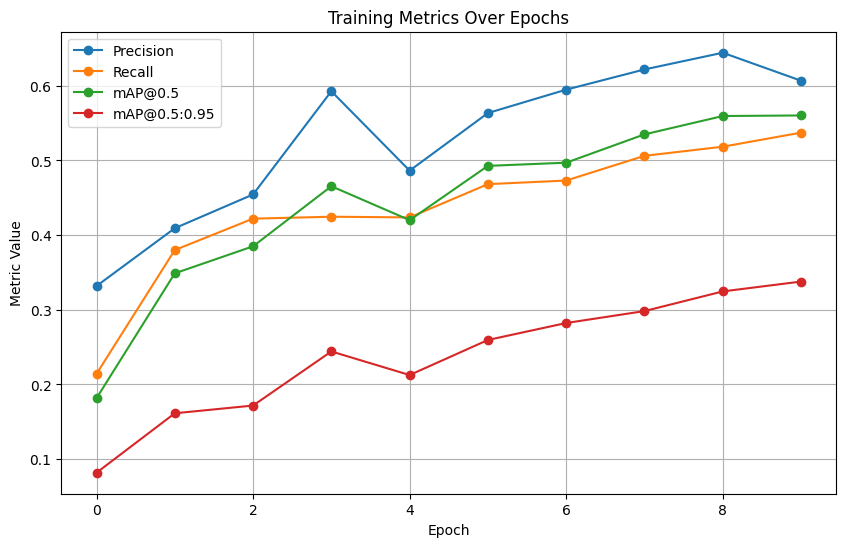

In [ ]:
import os
import pandas as pd
from tabulate import tabulate

# Define the path to the results.csv file
results_csv_path = 'runs/train/exp/results.csv'  # Modify this path according to your directory structure

# Check if the results file exists
if os.path.exists(results_csv_path):
    # Load the results into a DataFrame
    df = pd.read_csv(results_csv_path)

    # Strip leading and trailing spaces from column names
    df.columns = df.columns.str.strip()

    # Update the columns to display based on actual DataFrame columns
    columns_to_display = ['epoch', 'metrics/precision', 'metrics/recall', 'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95']

    # Filter the DataFrame to display only the selected columns
    df = df[columns_to_display]

    # Print the DataFrame as a table
    print(tabulate(df, headers='keys', tablefmt='grid'))
else:
    print(f"Results file not found: {results_csv_path}")


# Plot Precision, Recall, and mAP over Epochs
plt.figure(figsize=(10, 6))

# Plot Precision
plt.plot(df['epoch'], df['metrics/precision'], label='Precision', marker='o')

# Plot Recall
plt.plot(df['epoch'], df['metrics/recall'], label='Recall', marker='o')

# Plot mAP@0.5
plt.plot(df['epoch'], df['metrics/mAP_0.5'], label='mAP@0.5', marker='o')

# Plot mAP@0.5:0.95
plt.plot(df['epoch'], df['metrics/mAP_0.5:0.95'], label='mAP@0.5:0.95', marker='o')

plt.xlabel('Epoch')
plt.ylabel('Metric Value')
plt.title('Training Metrics Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

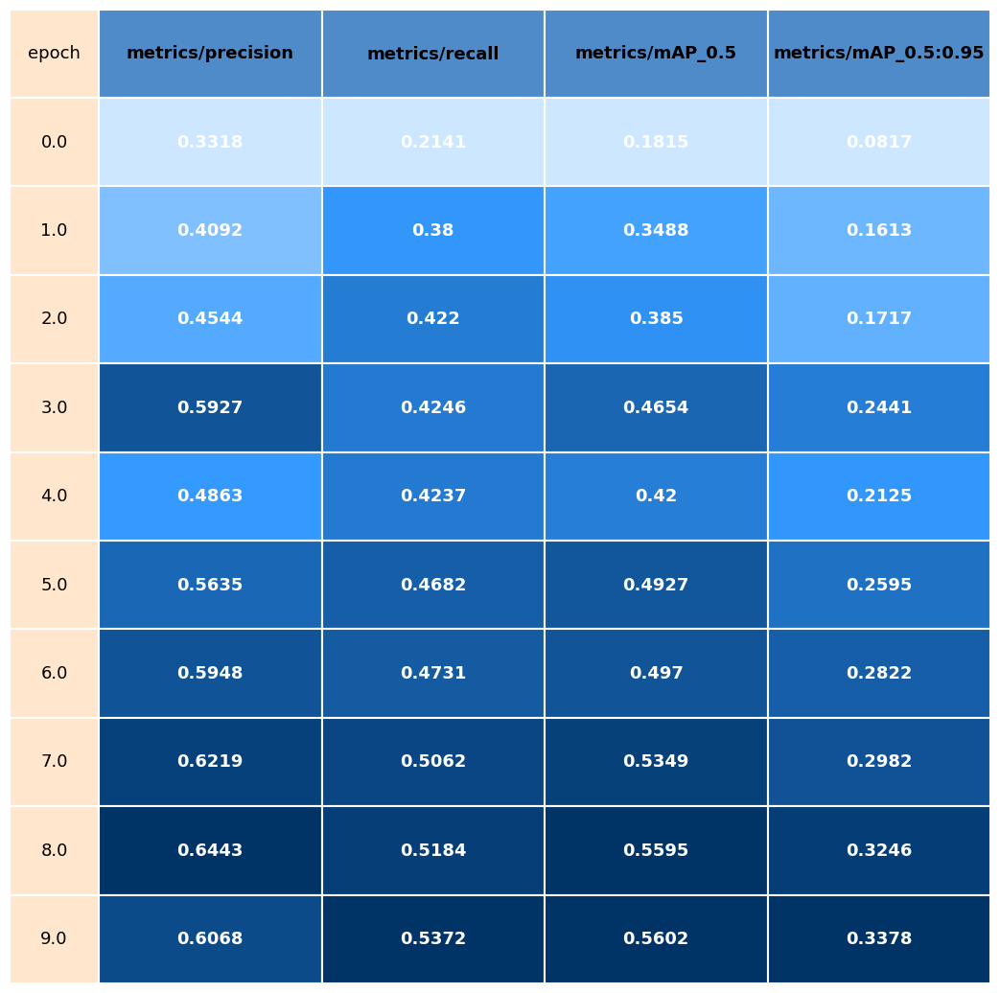

In [18]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Data
data = {
    'epoch': list(range(10)),
    'metrics/precision': [0.33176, 0.4092, 0.45442, 0.59271, 0.48633, 0.56348, 0.59483, 0.62187, 0.64427, 0.60677],
    'metrics/recall': [0.21413, 0.37997, 0.422, 0.42461, 0.42367, 0.46825, 0.47306, 0.50616, 0.51838, 0.53723],
    'metrics/mAP_0.5': [0.18147, 0.34877, 0.38498, 0.46544, 0.42, 0.49272, 0.49698, 0.53491, 0.55947, 0.56025],
    'metrics/mAP_0.5:0.95': [0.081697, 0.16132, 0.17167, 0.24414, 0.21254, 0.25952, 0.28222, 0.29821, 0.32455, 0.33775]
}

# Convert to DataFrame
df = pd.DataFrame(data)

# Set up a custom color gradient
colors = ["#cce7ff", "#3399ff", "#003366"]
cmap = LinearSegmentedColormap.from_list("custom_blue", colors)

# Plot as a styled table with color mapping
fig, ax = plt.subplots(figsize=(12, 6))  # Increase figure size for wider columns
ax.axis('tight')
ax.axis('off')

# Draw the table
table = ax.table(cellText=df.round(4).values, colLabels=df.columns, cellLoc='center', loc='center', colColours=["#4f8bc9"]*len(df.columns))

# Styling the table cells
for (i, j), cell in table.get_celld().items():
    cell.set_edgecolor("#FFFFFF")  # White cell borders for a clean look
    cell.set_linewidth(1.5)
    cell.set_text_props(fontfamily="DejaVu Sans", color="black")  # Use DejaVu Sans

    # Adjust cell height and width for larger columns
    cell.set_height(0.2)
    if j == 0:
        cell.set_width(0.1)  # Wider width for the epoch column
        cell.set_facecolor("#ffe6cc")  # Light peach for the epoch column
    else:
        cell.set_width(0.25)  # Set a wide width for metric columns
        if i <= 1:
            # Header row styling
            cell.set_text_props(weight="bold", fontsize=14)
            cell.set_facecolor("#4f8bc9")  # Custom blue header
        else:
            # Body cell styling based on value
            cell.set_text_props(weight="bold", fontsize=10)
            cell.set_text_props(fontfamily="DejaVu Sans", color="white")  # Use DejaVu Sans
            normalized_value = (df.iloc[i - 1, j] - df.iloc[:, j].min()) / (df.iloc[:, j].max() - df.iloc[:, j].min())
            cell.set_facecolor(cmap(normalized_value))  # Gradient color based on cell value

# Set table font size
table.auto_set_font_size(False)
table.set_fontsize(13)

# Save as an image
plt.savefig("modern_wide_colorful_table.png", dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()